In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from typing import Tuple, List
import pandas as pd
from tqdm import tqdm
from glob import glob
from tensorflow import data as tfd
from tensorflow import image as tfi
import plotly.express as px
import matplotlib.pyplot as plt
from IPython.display import clear_output as cls
from tensorflow.keras import Sequential
from tensorflow.keras.utils import plot_model
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report

In [ ]:
# Model Hypertunning
!pip install -q keras_tuner
cls()
import keras_tuner as kt

In [ ]:
IMAGE_SIZE = 160
BATCH_SIZE = 32
EPOCHS = 50

# Hyperparameters
LEARNING_RATE = 1e-3

# making the bdirectory path
root_dir = "/content/drive/MyDrive/Image_Classification"
train_dir = "/content/drive/MyDrive/Image_Classification/train/"
valid_dir = "/content/drive/MyDrive/Image_Classification/valid/"
test_dir = "/content/drive/MyDrive/Image_Classification/test/"

LOSS = 'sparse_categorical_crossentropy'
METRICS = ['accuracy']
random_seed = 42
tf.random.set_seed(random_seed) # set random seed for TensorFlow
np.random.seed(random_seed) # set random seed for NumPy

In [ ]:
# ptinting the name of fruit
class_names = sorted(os.listdir(train_dir))
n_classes = len(class_names)

# Show
print(f"Total number of classes: {n_classes}")
print(f"Classes: {class_names}")

Total number of classes: 5
Classes: ['Apple', 'Banana', 'Grape', 'Mango', 'Strawberry']


In [ ]:
def load_image(image_path: str) -> tf.Tensor:
    assert os.path.exists(image_path), f'Invalid image path: {image_path}'

    image = tf.io.read_file(image_path)
    try:
        image = tfi.decode_jpeg(image, channels=3)
    except:
        image = tfi.decode_png(image, channels=3)

    image = tfi.convert_image_dtype(image, tf.float32)
    image = tfi.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

    # Convert image data type to tf.float32
    image = tf.cast(image, tf.float32)

    return image

In [ ]:
def load_dataset(root_path: str, class_names: list, trim: int=None) -> Tuple[np.ndarray, np.ndarray]:

    if trim:
        n_samples = len(class_names) * trim
    else:
        n_samples = sum([len(os.listdir(os.path.join(root_path, name))) for name in class_names])

    images = np.empty(shape=(n_samples, IMAGE_SIZE, IMAGE_SIZE, 3), dtype=np.float32)
    labels = np.empty(shape=(n_samples, 1), dtype=np.int32)

    n_image = 0
    for class_name in tqdm(class_names, desc="Loading"):
        class_path = os.path.join(root_path, class_name)
        image_paths = list(glob(os.path.join(class_path, "*")))[:trim]
        for file_path in image_paths:
            image = load_image(file_path)

            label = class_names.index(class_name)

            images[n_image] = image
            labels[n_image] = label

            n_image += 1

    # Shuffle the data
    indices = np.random.permutation(n_samples)
    images = images[indices]
    labels = labels[indices]


    return images, labels

# Loading the Data Set

In [ ]:
X_train, y_train = load_dataset(root_path = train_dir, \
                                class_names = class_names, trim=1000)

X_valid, y_valid = load_dataset(root_path = valid_dir, class_names = class_names)

X_test, y_test = load_dataset(root_path = test_dir, class_names = class_names)

Loading: 100%|██████████| 5/5 [00:23<00:00,  4.61s/it]


# **Showing the Data Distribution**

In [ ]:
class_dis = [len(os.listdir(train_dir + name)) for name in class_names]

# Create a pie chart
pie_chart = px.pie(values=class_dis, names=class_names, color=class_names)

# Update chart layout for better positioning of title and legend
pie_chart.update_layout(
    title={'text': "Class Distribution", 'font': {'size': 35}, 'x': 0.5, 'y': 0.98},
    legend={'title': None, 'font': {'size': 20}, 'x': 0.85, 'y': 0.02},
    margin=dict(l=0, r=0, b=0, t=40),
    height=600,
    width=800)

# Show the chart
pie_chart.show()


# *Visualisation*


In [ ]:
def show_images(images: np.ndarray, labels: np.ndarray, n_rows: int=1, \
                n_cols: int=5, figsize: tuple=(15, 6), \
                model: tf.keras.Model=None) -> None:
    for row in range(n_rows):

        plt.figure(figsize=figsize)
        rand_indices = np.random.choice(len(images), size=n_cols, replace=False)

        for col, index in enumerate(rand_indices):
            image = images[index]
            label = class_names[int(labels[index])]

            if model:
                prediction = model.predict(np.expand_dims(tf.squeeze(image), axis=0), verbose=0)[0]
                conf = np.max(prediction, axis=-1)
                label += "\nPrediction: {} - {:.4}".format(class_names[np.argmax(prediction)], conf)

            # Plot the image and label
            plt.subplot(1, n_cols, col+1)
            plt.imshow(image)
            plt.title(label.title())
            plt.axis("off")

        # Show the row of images
        plt.show()

***Showing the Images***

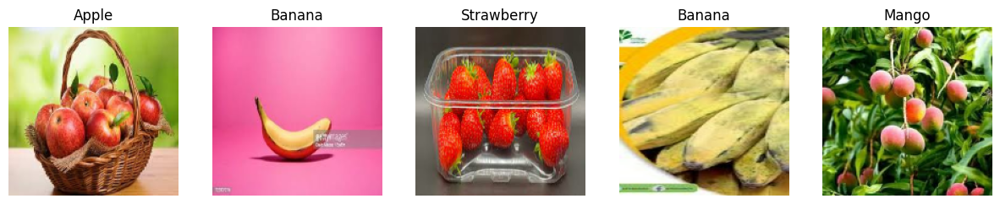

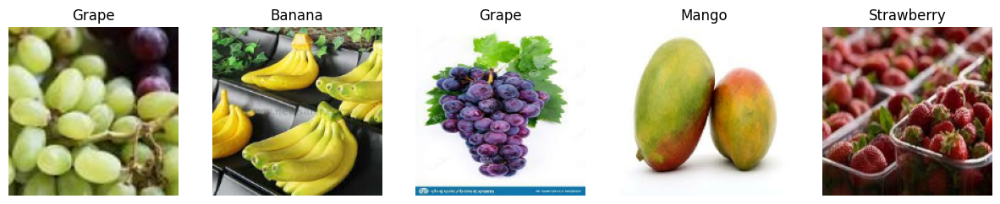

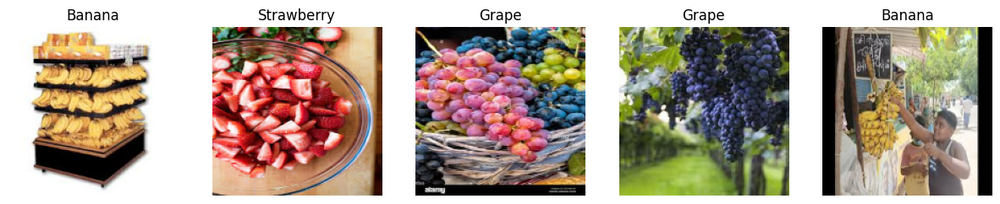

In [ ]:
show_images(images=X_train, labels=y_train, n_rows=3)

MobileNetV2 Hypertuning

In [ ]:
print("Loading MobileNet Backbone: ")
mobilenet = MobileNetV2(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), weights='imagenet', include_top=False)

mobilenet.trainable = False

mobilenet = Sequential([
    mobilenet,
    GlobalAveragePooling2D(),
    Dropout(0.5),
    Dense(n_classes, activation='softmax')
])

mobilenet.compile(
    loss=LOSS,
    optimizer=Adam(learning_rate=LEARNING_RATE),
    metrics=METRICS
)

print("\nTraining Baseline Model: ")
mobilenet.fit(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    epochs=20,
    callbacks=[
        EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint("MobileNetV2Baseline.h5", save_best_only=True)
    ],
    batch_size=BATCH_SIZE
)

mobilenet_test_loss, mobilenet_test_acc = mobilenet.evaluate(X_test, y_test)
print(f"\nMobileNet Baseline Testing Loss     : {mobilenet_test_loss}.")
print(f"MobileNet Baseline Testing Accuracy : {mobilenet_test_acc}.")

Loading MobileNet Backbone: 
9406464/9406464 [==============================] - 0s 0us/step

Training Baseline Model: 
Epoch 1/20
157/157 [==============================] - ETA: 0s - loss: 1.0178 - accuracy: 0.6246

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



157/157 [==============================] - 109s 670ms/step - loss: 1.0178 - accuracy: 0.6246 - val_loss: 0.5890 - val_accuracy: 0.7850
Epoch 2/20
157/157 [==============================] - 105s 668ms/step - loss: 0.5771 - accuracy: 0.7928 - val_loss: 0.4784 - val_accuracy: 0.7950
Epoch 3/20
157/157 [==============================] - 104s 659ms/step - loss: 0.4885 - accuracy: 0.8224 - val_loss: 0.4861 - val_accuracy: 0.8000
Epoch 4/20
157/157 [==============================] - 115s 730ms/step - loss: 0.4558 - accuracy: 0.8418 - val_loss: 0.4401 - val_accuracy: 0.8400
Epoch 5/20
157/157 [==============================] - 121s 772ms/step - loss: 0.4179 - accuracy: 0.8470 - val_loss: 0.4172 - val_accuracy: 0.8200
Epoch 6/20
157/157 [==============================] - 109s 691ms/step - loss: 0.3957 - accuracy: 0.8528 - val_loss: 0.3980 - val_accuracy: 0.8450
Epoch 7/20
157/157 [==============================] - 108s 686ms/step - loss: 0.3967 - accuracy: 0.8528 - val_loss: 0.4125 - val_accura

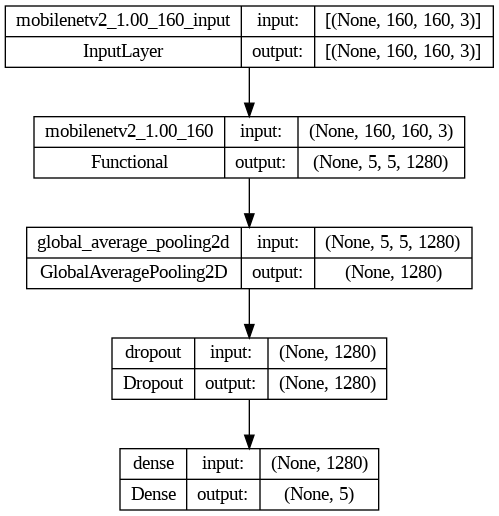

In [ ]:
plot_model(mobilenet, to_file='mobilenet_model.png', show_shapes=True, show_layer_names=True)

In [ ]:
def build_model(hp):

    mobilenet = MobileNetV2(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), weights='imagenet', include_top=False)
    mobilenet.trainable = False
    n_layers = hp.Choice('n_layers', [2, 4])
    dropout_rate = hp.Choice('rate', [0.4, 0.7])
    n_units = hp.Choice('units', [256, 512])
    learning_rate = hp.Choice('lr', [LEARNING_RATE, LEARNING_RATE * 0.1, LEARNING_RATE*0.01])

    # Mode architecture
    model = Sequential([mobilenet, GlobalAveragePooling2D(),])

    for _ in range(n_layers):
        model.add(Dense(n_units, activation='relu', kernel_initializer='he_normal'))

    model.add(Dropout(dropout_rate))

    model.add(Dense(n_classes, activation='softmax'))

    model.compile(
        loss=LOSS,
        optimizer = Adam(learning_rate),
        metrics = METRICS
    )

    return model

In [ ]:
random_searcher = kt.RandomSearch(
    hypermodel=build_model,
    objective='val_loss',
    max_trials=2,
    seed=42,
    project_name="MobileNetSearch",
    loss=LOSS)

search = random_searcher.search(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    epochs = 10,
    batch_size = BATCH_SIZE)

Trial 2 Complete [00h 18m 33s]
val_loss: 0.5001280307769775

Best val_loss So Far: 0.47173237800598145
Total elapsed time: 00h 36m 12s


In [ ]:
# Best Hyper params
best_hps = random_searcher.get_best_hyperparameters()[0]
print(f"Best Hyper Params founded: {best_hps.values}\n")

# Build the best model
mobile_net_model = build_model(best_hps)
mobile_net_model.summary()

# Compile the model
print("\nTraining Best Model Architecture : ")
mobile_net_model_history = mobile_net_model.fit(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    epochs=20,
    batch_size=BATCH_SIZE,
    callbacks=[
        EarlyStopping(patience=5, restore_best_weights=True),
        ModelCheckpoint('BestMobileNet.h5', save_best_only=True)
    ])

Best Hyper Params founded: {'n_layers': 4, 'rate': 0.4, 'units': 256, 'lr': 0.001}

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_160 (Func  (None, 5, 5, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_5 (Dense)             (None, 256)               327936    
                                                                 
 dense_6 (Dense)             (None, 256)               65792     
                                                                 
 dense_7 (Dense)             (None, 256)               65792     
                                    

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



157/157 [==============================] - 110s 677ms/step - loss: 0.6743 - accuracy: 0.7510 - val_loss: 0.4619 - val_accuracy: 0.8250
Epoch 2/20
157/157 [==============================] - 103s 657ms/step - loss: 0.3550 - accuracy: 0.8764 - val_loss: 0.4542 - val_accuracy: 0.8300
Epoch 3/20
157/157 [==============================] - 102s 651ms/step - loss: 0.2496 - accuracy: 0.9172 - val_loss: 0.5191 - val_accuracy: 0.8450
Epoch 4/20
157/157 [==============================] - 101s 642ms/step - loss: 0.1654 - accuracy: 0.9438 - val_loss: 0.4926 - val_accuracy: 0.8450
Epoch 5/20
157/157 [==============================] - 102s 651ms/step - loss: 0.1377 - accuracy: 0.9520 - val_loss: 0.6132 - val_accuracy: 0.8350
Epoch 6/20
157/157 [==============================] - 109s 692ms/step - loss: 0.0922 - accuracy: 0.9694 - val_loss: 0.7693 - val_accuracy: 0.8200
Epoch 7/20
157/157 [==============================] - 106s 674ms/step - loss: 0.0676 - accuracy: 0.9778 - val_loss: 0.7877 - val_accura

In [ ]:
test_loss, test_acc = mobile_net_model.evaluate(X_test, y_test)
print("Training Loss    : {:.4} | Baseline : {:.4}".format(test_loss, mobilenet_test_loss))
print("Training Accuracy: {:.4}% | Baseline : {:.4}%".format(test_acc*100, mobilenet_test_acc*100))

4/4 [==============================] - 2s 383ms/step - loss: 0.3915 - accuracy: 0.8300
Training Loss    : 0.3915 | Baseline : 0.3256
Training Accuracy: 83.0% | Baseline : 90.0%


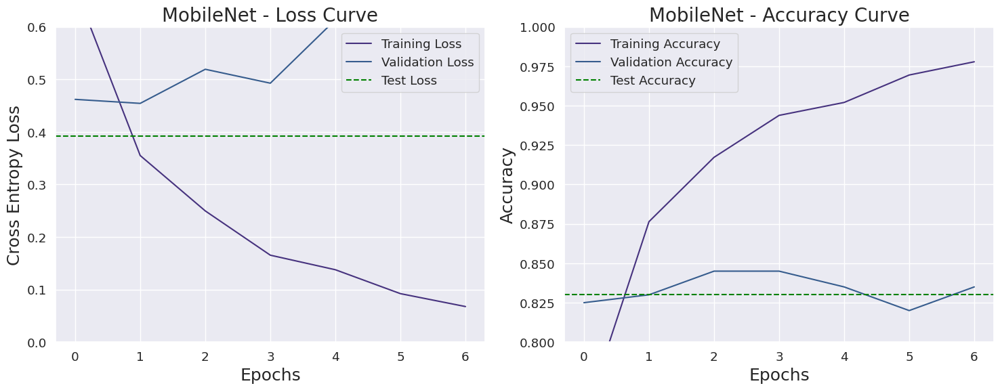

In [ ]:
import seaborn as sns

# Use Seaborn for a dark background and a more professional color palette
sns.set(style="darkgrid", font_scale=1.2, palette="viridis")

# Create a figure and axis objects
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot the loss curve in the first subplot
sns.lineplot(x=mobile_net_model_history.index, y=mobile_net_model_history['loss'], label="Training Loss", ax=axes[0])
sns.lineplot(x=mobile_net_model_history.index, y=mobile_net_model_history['val_loss'], label="Validation Loss", ax=axes[0])

# Horizontal line to show the testing performance
axes[0].axhline(y=test_loss, label="Test Loss", linestyle='--', color='green')

# Set the x- and y-labels, and the x- and y-limits
axes[0].set_title("MobileNet - Loss Curve", fontsize=20)
axes[0].set_xlabel("Epochs", fontsize=18)
axes[0].set_ylabel("Cross Entropy Loss", fontsize=18)
axes[0].set_ylim([0, 0.6])
axes[0].legend()

# Plot the accuracy curve in the second subplot
sns.lineplot(x=mobile_net_model_history.index, y=mobile_net_model_history['accuracy'], label="Training Accuracy", ax=axes[1])
sns.lineplot(x=mobile_net_model_history.index, y=mobile_net_model_history['val_accuracy'], label="Validation Accuracy", ax=axes[1])

# Horizontal line to show the testing performance
axes[1].axhline(y=test_acc, label="Test Accuracy", linestyle='--', color='green')

# Set the x- and y-labels, and the x- and y-limits
axes[1].set_title("MobileNet - Accuracy Curve", fontsize=20)
axes[1].set_xlabel("Epochs", fontsize=18)
axes[1].set_ylabel("Accuracy", fontsize=18)
axes[1].set_ylim([0.80, 1])
axes[1].legend()

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()


# Predictions

In [ ]:
baseline_pred = np.argmax(mobilenet.predict(X_test, verbose=0), axis=-1)
best_pred = np.argmax(mobile_net_model.predict(X_test, verbose=0), axis=-1)

# Evaluate prediction : Precision
baseline_pre = precision_score(y_test, baseline_pred, average='macro')
best_pre = precision_score(y_test, best_pred, average='macro')

# Evaluate prediction : Recall
baseline_recall = recall_score(y_test, baseline_pred, average='macro')
best_recall = recall_score(y_test, best_pred, average='macro')

# Evaluate prediction : F1 Score
baseline_f1 = f1_score(y_test, baseline_pred, average='macro')
best_f1 = f1_score(y_test, best_pred, average='macro')

print("{:20} | {:20}".format("Baseline Performance", "Best Performance\n"))
print("{:10} : {:.5}  | {:.5}".format("Precision", baseline_pre, best_pre))
print("{:10} : {:.5}    | {:.5}".format("Recall", baseline_recall, best_recall))
print("{:10} : {:.5} | {:.5}".format("F1 Score", baseline_f1, best_f1))



Baseline Performance | Best Performance
   
Precision  : 0.8999  | 0.83904
Recall     : 0.9    | 0.83
F1 Score   : 0.89972 | 0.82921


In [ ]:
print(classification_report(y_test, baseline_pred))
print(classification_report(y_test, best_pred))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85        20
           1       0.90      0.95      0.93        20
           2       0.90      0.90      0.90        20
           3       0.95      0.95      0.95        20
           4       0.89      0.85      0.87        20

    accuracy                           0.90       100
   macro avg       0.90      0.90      0.90       100
weighted avg       0.90      0.90      0.90       100

              precision    recall  f1-score   support

           0       0.74      0.70      0.72        20
           1       0.86      0.90      0.88        20
           2       1.00      0.75      0.86        20
           3       0.79      0.95      0.86        20
           4       0.81      0.85      0.83        20

    accuracy                           0.83       100
   macro avg       0.84      0.83      0.83       100
weighted avg       0.84      0.83      0.83       100



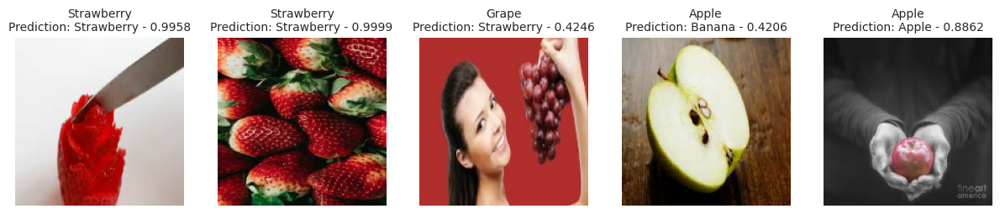

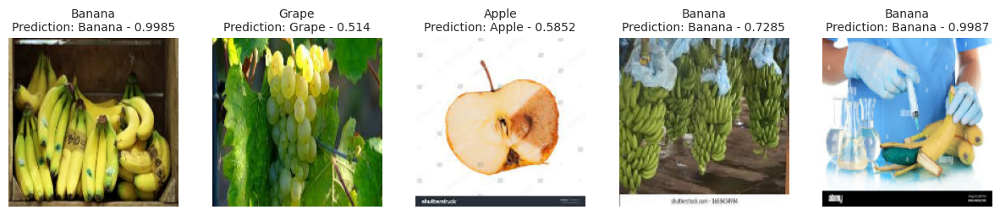

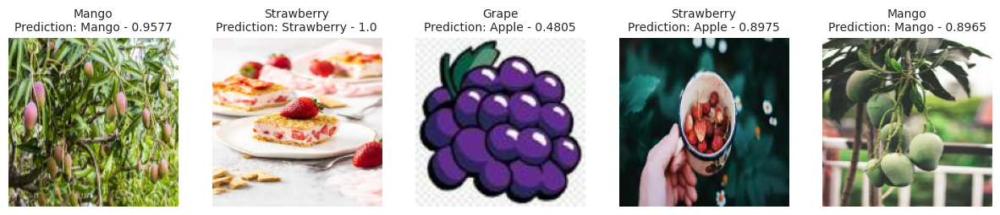

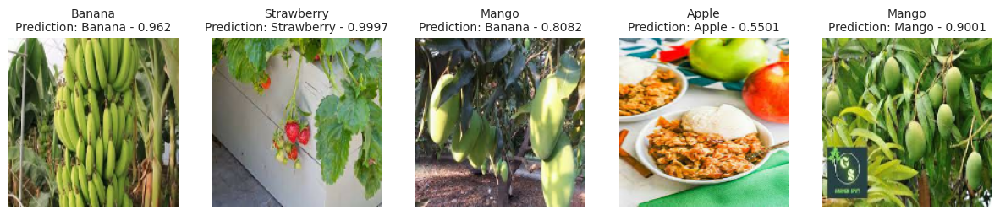

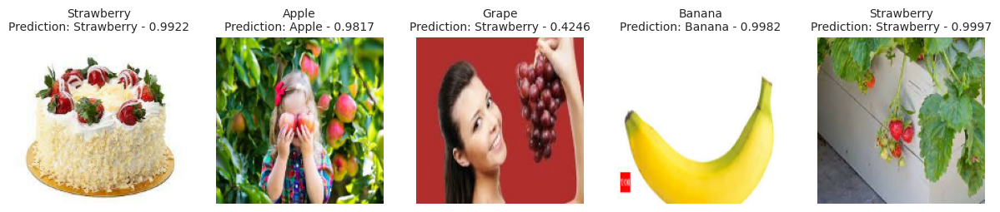

...

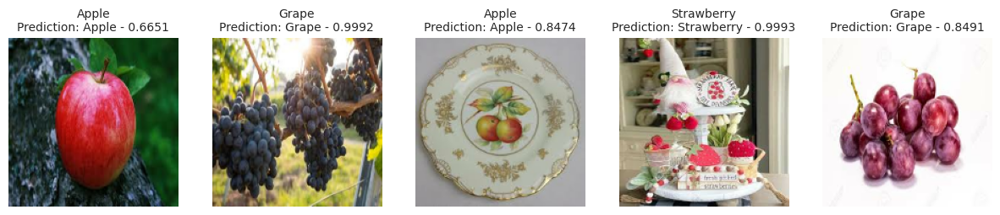

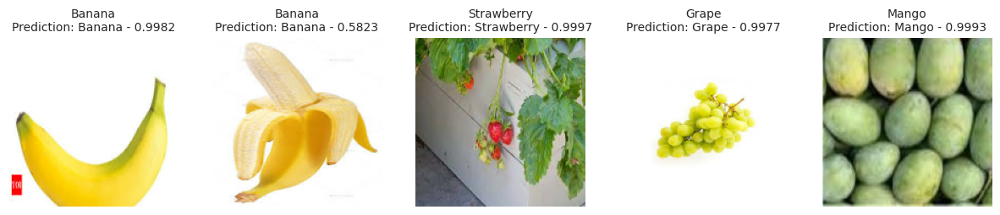

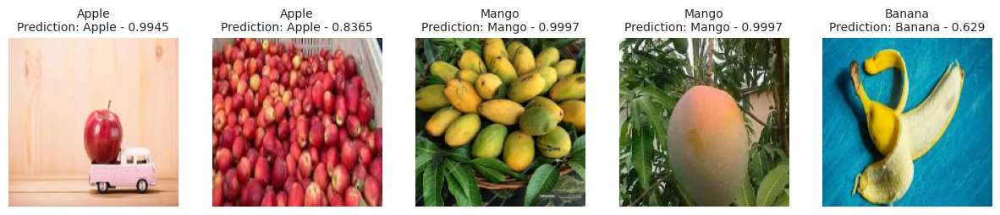

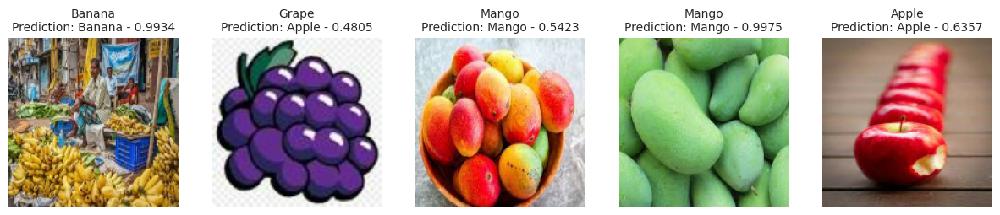

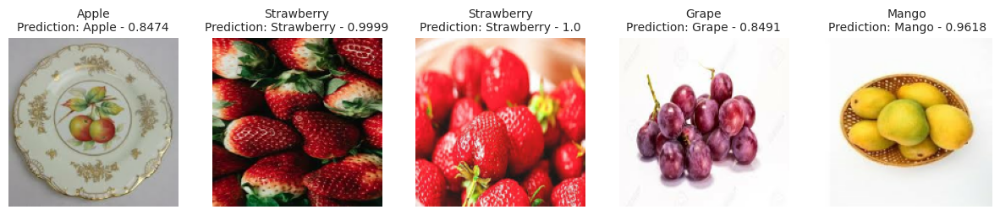

In [ ]:
def show_images(images: np.ndarray, labels: np.ndarray, n_rows: int=1, \
                n_cols: int=5, figsize: tuple=(15, 6), \
                model: tf.keras.Model=None, title_fontsize: int=14) -> None:
    for row in range(n_rows):

        plt.figure(figsize=figsize)
        rand_indices = np.random.choice(len(images), size=n_cols, replace=False)

        for col, index in enumerate(rand_indices):
            image = images[index]
            label = class_names[int(labels[index])]

            if model:
                prediction = model.predict(np.expand_dims(tf.squeeze(image), axis=0), verbose=0)[0]
                conf = np.max(prediction, axis=-1)
                label += "\nPrediction: {} - {:.4}".format(class_names[np.argmax(prediction)], conf)

            plt.subplot(1, n_cols, col+1)
            plt.imshow(image)
            plt.title(label.title(), fontsize=title_fontsize)
            plt.axis("off")

        plt.show()

show_images(images=X_test, labels=y_test, model=mobile_net_model, n_rows=20, title_fontsize=10)
